# Geospatial Big Data Analytics

DSML NTUA MSc
Vasileios Depastas
AM: 03400131

## Question 1
Αφού επιλέξετε περιοχή μελέτης, αναζητήστε δεδομένα raster, vector και δεδομένα χρονοσειρών για την συγκεκριμένη περιοχή. Χρησιμοποιήστε τουλάχιστον 2 διαφορετικές πηγές, καθώς και την υπηρεσία WFS.
[ενδεικτικές βιβλιοθήκες Python]: rasterio (για τα δεδομένα raster, εικόνες, κοκ), geopandas (δεδομένα vector, σημεία, πολύγωνα, κοκ και WFS υπηρεσία μεταμόρφωσης), pandas (εισαγωγή flat αρχείων)
[ενδεικτικά βήματα]:
✓ Πραγματοποιήστε λήψη διαχρονικών δεδομένων Sentinel-2 που απεικονίζουν την ευρύτερη περιοχή της Καστοριάς (https://pithos.okeanos.grnet.gr/public/fBSNLJeNxerluMj2MVDqF). Παρατηρήστε το συνοδευτικό PDF της εικόνας και τις αντιστοιχίες καναλιών και ημερομηνιών.
✓ Δημιουργήστε ένα vector αρχείο (π.χ GeoJSON, ESRI Shapefile) μέσω QGIS ή και στο geojson.io (https://geojson.io/) με την περιοχή μελέτης (πολύγωνο) πάνω στα δεδομένα Sentinel-2 της Καστοριάς και πραγματοποιήστε εισαγωγή του στην Python.
✓ Κάντε λήψη χρονοσειράς μετεωρολογικών δεδομένων από το portal της NASA (https://power.larc.nasa.gov/data-access-viewer/) για ένα σημείο εντός της περιοχής μελέτης και εισάγετε τα δεδομένα στην Python.
✓ Αναζητήστε τη WFS υπηρεσία για το Corine Land Cover 2018 και εισάγετε τα δεδομένα σας.

## Question 2.1
- For Sentinel-2 images timeseries downloaded, visualize for a date of your choice the bands Red, Green and Blue separately. Also, you can visualize selected indexes such as NDVI, EVI etc.

Sentinel 2 data loading from the broader Katoria region in Greece (<a href="https://pithos.okeanos.grnet.gr/public/fBSNLJeNxerluMj2MVDqF">Link to download data</a>). According to the pdf accompanying the data, there are two `.tif` large files:
- `Kastoria.tif`: 24 raster images spanning from 25-01-2016 until 30-12-2016 (corresponding doy range: 25 - 365) with 10 bands per image. This results in a spectro-temporal cube of dimension 240 x 2017 x 2281.
- `Kast_RefData_26Classes.tif`: image with 26 class codes for different land usages classification.

In [1]:
# imports
import os
import rasterio
from rasterio.plot import show
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import fiona
import geopandas as gpd
import rtree
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.mask import mask as msk

from owslib.wms import WebMapService
from owslib.wfs import WebFeatureService
from requests import Request
import requests

In [5]:
# constants
KASTORIA_DATA_PATH = '/Kastoria_dataset/Kastoria.tif/'

In [3]:
full_kastoria_tiff_path = os.getcwd() + KASTORIA_DATA_PATH # combine current working directory with KASTORIA_DATA_PATH

# open Kastoria.tif dataset of 240 images (24 images with 10 bands each = 240)
with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif:
    print(f'The Kastoria dataset: {kastoria_tif}')
    print(f'Dataset shape: {kastoria_tif.read().shape}')

    bands_dtypes = set()
    nodatavalues = 0
    for i, dtype, nodataval in zip(kastoria_tif.indexes, kastoria_tif.dtypes, kastoria_tif.nodatavals):
        bands_dtypes.add(dtype) # add dtype element if not already in set
        if not nodataval: nodataval = 0
        nodatavalues += nodataval # sum of number of no data values
    print(f'The data types of the bands are: {bands_dtypes}')
    print(f'There are {nodatavalues} no data values in the dataset')

The Kastoria dataset: <open DatasetReader name='C:/Users/User/Downloads/DSML MsC/2nd semester/Γεωχωρικα/Geospatial_Lab Exercises/Lab02/Kastoria_dataset/Kastoria.tif' mode='r'>
Dataset shape: (240, 2017, 2281)
The data types of the bands are: {'float32'}
There are 0 no data values in the dataset


We will use matplotlib and rasterio to plot an image's specific color band next.

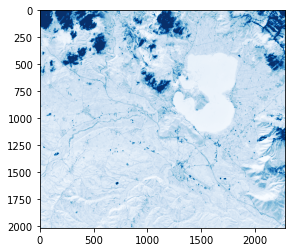

In [33]:
with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif: # open image dataset
    first_image_blue_band = kastoria_tif.read(1) # get the first/blue band of the first image of the dataset (first image has 10 bands spanning from indexes 1-10)
    plt.imshow(first_image_blue_band, cmap='Blues') # and use matplotlib to plot it
    plt.show()

However, using matplotlib we can see the pixel ranges in the two axis (horizontal and vertical) but we cannot label the axes with proper geo-referenced extents. This can be accomplished with rasterio.plot.show().

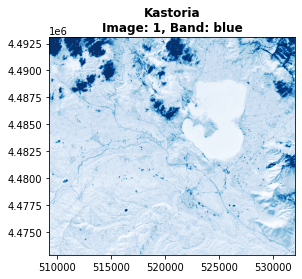

In [51]:
with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif: # open image dataset
    #The 1st image (first date of dataset) has indexes 1,2,...,10 for its 10 bands
    #The 1st band of it is the Blue band hence we will use 1 as the index for the image we plot below
    show(source=(kastoria_tif, 1), title='Kastoria\nImage: 1, Band: blue', cmap='Blues', with_bounds=True)

It's obvious that rasterio.plot.show() extends matplotlib's imshow() and can have geo-referenced axes.
Now we plot the three bands, R(Red), G(Green) and B(Blue).

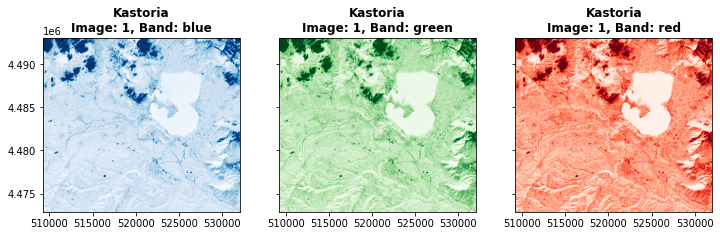

In [52]:
with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif: # open image dataset

    fig, (ax_blue, ax_green, ax_red) = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(12,7))

    show(source=(kastoria_tif, 1), ax=ax_blue, title='Kastoria\nImage: 1, Band: blue', cmap='Blues', with_bounds=True)
    show(source=(kastoria_tif, 2), ax=ax_green, title='Kastoria\nImage: 1, Band: green', cmap='Greens', with_bounds=True)
    show(source=(kastoria_tif, 3), ax=ax_red, title='Kastoria\nImage: 1, Band: red', cmap='Reds', with_bounds=True)

We also construct and plot the RGB raster image (1st image of Kastoria's tif dataset) from the three bands.

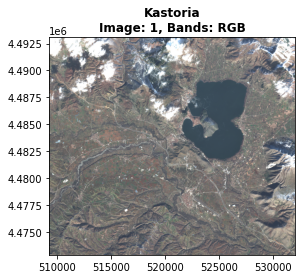

In [62]:
with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif: # open image dataset
    show(source=(kastoria_tif, (3,2,1)), title='Kastoria\nImage: 1, Bands: RGB', with_bounds=True)

We will now calculate the NDVI index for that first image and show it on a map layer:

In [61]:
np.subtract(10, 1)

9

In [2]:
def calculate_ndvi_band(red_band, nir_band) -> np.array:
    # NDVI = (NIR – Red) / (NIR + Red)
    #return (nir_band-red_band)/(nir_band+red_band)

    ndvi = np.divide(np.subtract(nir_band, red_band), np.add(nir_band, red_band))
    # if the ndvi denominator nir+red happens to be 0 (when nir=red=0) then the numpy assigns value np.inf, and here we replace this with 0
    ndvi = np.where(ndvi == np.inf, -1, ndvi)
    return ndvi


Max NDVI: 0.5877651572227478
Mean NDVI: -0.0372689850628376
Median NDVI: 0.0
Min NDVI: -0.6840791702270508


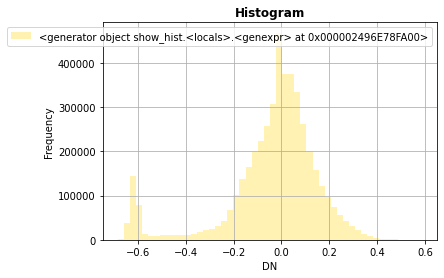

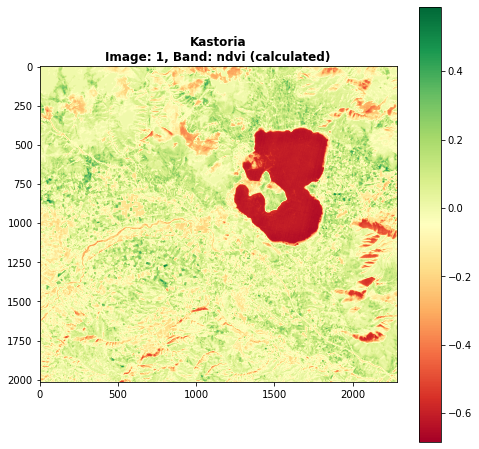

In [101]:
with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif: # open image dataset
    # calculate red, nir bands and derive from there the ndvi band for the first image of the dataset
    first_image_red_band = kastoria_tif.read(3) # NIR (near infrared)
    first_image_nir_band = kastoria_tif.read(4) # RED band
    first_image_ndvi_band = calculate_ndvi_band(red_band=first_image_red_band, nir_band=first_image_nir_band) # NDVI band
    # plot kastoria area's ndvi band map layer using RedYellowGreen colormap
    #show(source=first_image_ndvi_band, title='Kastoria\nImage: 1, Band: ndvi (calculated)', cmap='RdYlGn', with_bounds=True)

    # print some info on ndvi band
    print('\nMax NDVI: {m}'.format(m=first_image_ndvi_band.max()))
    print('Mean NDVI: {m}'.format(m=first_image_ndvi_band.mean()))
    print('Median NDVI: {m}'.format(m=np.median(first_image_ndvi_band)))
    print('Min NDVI: {m}'.format(m=first_image_ndvi_band.min()))

    # histogram of ndvi pixel values
    rasterio.plot.show_hist(first_image_ndvi_band, bins=50, histtype='stepfilled', lw=0.0, stacked=False, alpha=0.3)

    # figure with ndvi band and colormap on the side (vertical)
    fig, ax = plt.subplots(figsize=(8, 8))
    # use imshow so that we have something to map the colorbar to
    image_hidden = ax.imshow(first_image_ndvi_band, cmap='RdYlGn')
    # plot on the same axis with rio.plot.show
    show(source=first_image_ndvi_band, ax=ax, title='Kastoria\nImage: 1, Band: ndvi (calculated)', cmap='RdYlGn', with_bounds=True)
    # add colorbar using the now hidden image
    fig.colorbar(image_hidden, ax=ax)

In general, NDVI values range from -1.0 to 1.0, with negative values indicating clouds and water, positive values near zero indicating bare soil, and higher positive values of NDVI ranging from sparse vegetation (0.1 - 0.5) to dense green vegetation (0.6 and above).


## Question 2.2
- Select a region of interest (ROI) within the Kastoria area as given in the dataset and clip (crop) the selected ROI based on the vector file describing it.

A shape files stores both the geometric location and attribute information of geographic features like lines, points or polygons. Clipping an image is also called masking (of a raster file by a shape file). In our case, we use <a href="geojson.io">geojson.io</a> to draw a polygon region of interest (ROI) in Kastoria and download the shapefile related to that in order to clip it afterwards from the images of the dataset and concentrate subsequent steps on that ROI solely.

In [4]:
KASTORIA_POLYGON_SHAPEFILE = os.getcwd() + '/Shapefiles/Kastoria ROI/POLYGON.shp' # path to Kastoria polygon shapefile
KASTORIA_DATA_PATH_WITH_NEW_CRS = '/Kastoria_dataset/Kastoria_new_crs.tif/'
KASTORIA_DATA_PATH_WITH_NEW_CRS_CLIPPED = '/Kastoria_dataset/Kastoria_new_crs_clipped.tif/'

In [5]:
# Read shape file using geopandas
shape_file = gpd.read_file(filename=KASTORIA_POLYGON_SHAPEFILE)


# Check coordinate reference system (CRS) of both raster image(s) and shapefile
print('Shape file crs: ', shape_file.crs)
print('-----------------------------------------------------')
with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif: # open image dataset
    print('Kastoria raster images dataset file crs: ', kastoria_tif.crs)


Shape file crs:  epsg:4326
-----------------------------------------------------
Kastoria raster images dataset file crs:  EPSG:32634


We can see that the coordinate reference system for the Kastoria raster images dataset and the shapefile are different. Therefore, we will have to transform the projection of the dataset to match that of the shape file.

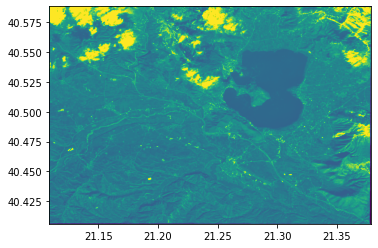

Transformed Imagery file Projection:  EPSG:4326
CPU times: total: 15min 21s
Wall time: 54min 19s


In [141]:
%%time

# Transform dataset crs to match that of shape file
target_crs = shape_file.crs # target crs (coordinate reference system)

# Save output dataset file after crs transformation
full_kastoria_new_crs_tiff_path = os.getcwd() + KASTORIA_DATA_PATH_WITH_NEW_CRS

with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif: # open image dataset
    transform, width, height = calculate_default_transform(kastoria_tif.crs, target_crs, kastoria_tif.width, kastoria_tif.height, *kastoria_tif.bounds)
    kwargs = kastoria_tif.meta.copy()
    kwargs.update({'crs': target_crs, 'transform': transform, 'width': width, 'height': height})
    with rasterio.open(fp=full_kastoria_new_crs_tiff_path, mode='w', **kwargs) as dst: # open image dataset that we will write the new transformed crs dataset
        for i in range(1, kastoria_tif.count + 1):
            reproject(
                source=rasterio.band(kastoria_tif, i),
                destination=rasterio.band(dst, i),
                src_transform=kastoria_tif.transform,
                src_crs=kastoria_tif.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest,
                num_threads=8)


# Plot again after transformation. You can observe axis value have changed
tr_imagery = rasterio.open(full_kastoria_new_crs_tiff_path)
# Plot trasformed imagery
show(tr_imagery)

# Check coordinate reference system of transformed imagery, it's changed or not?
print('Transformed Imagery file Projection: ', tr_imagery.crs)
# tr_imagery.crs

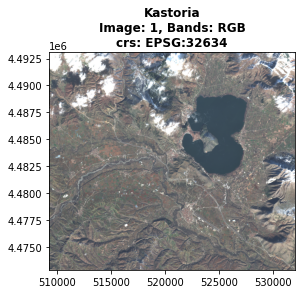

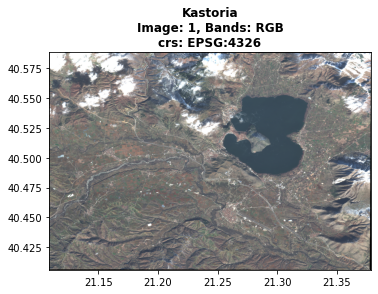

In [143]:
with rasterio.open(fp=full_kastoria_tiff_path, mode='r') as kastoria_tif: # open image dataset
    show(source=(kastoria_tif, (3,2,1)), title=f'Kastoria\nImage: 1, Bands: RGB\ncrs: {kastoria_tif.crs}', with_bounds=True)

with rasterio.open(fp=full_kastoria_new_crs_tiff_path, mode='r') as kastoria_tif: # open modified crs image dataset
    show(source=(kastoria_tif, (3,2,1)), title=f'Kastoria\nImage: 1, Bands: RGB\ncrs: {kastoria_tif.crs}', with_bounds=True)

Now that the initial EPSG 32634 dataset is transformed to EPSG 4326, we can clip the ROI from it.

In [20]:
# Clipping the image

# Read shapefile
with fiona.open(KASTORIA_POLYGON_SHAPEFILE, mode='r') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# Read raster images transformed crs dataset file
with rasterio.open(fp=full_kastoria_new_crs_tiff_path, mode='r') as kastoria_tif_transformed: # open modified crs image dataset
    out_image, out_transform = msk(kastoria_tif_transformed, shapes, crop=True)
    out_meta = kastoria_tif_transformed.meta

# Save clipped images dataset
out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

# Save output dataset file after clipping of all the iamges and bands
full_kastoria_new_crs_clipped_tiff_path = os.getcwd() + KASTORIA_DATA_PATH_WITH_NEW_CRS_CLIPPED
with rasterio.open(fp=full_kastoria_new_crs_clipped_tiff_path, mode="w", **out_meta) as dest:
    dest.write(out_image)

In [25]:
with rasterio.open(fp=full_kastoria_new_crs_clipped_tiff_path, mode="r") as clipped_dataset:
    print('Clipped dataset information:')
    print(f'CRS: {clipped_dataset.crs}')
    print(f'# Images: {clipped_dataset.count}')
    print(f'Images (width, height) = {clipped_dataset.width, clipped_dataset.height}')

Clipped dataset information:
CRS: EPSG:4326
# Images: 240
Images (width, height) = (534, 389)


We can plot the original RGB image of the original Kastoria area of the initial dataset along with the mask (ROI) that we clipped in order to visualize the region that we keep for subsequent analysis in next steps.

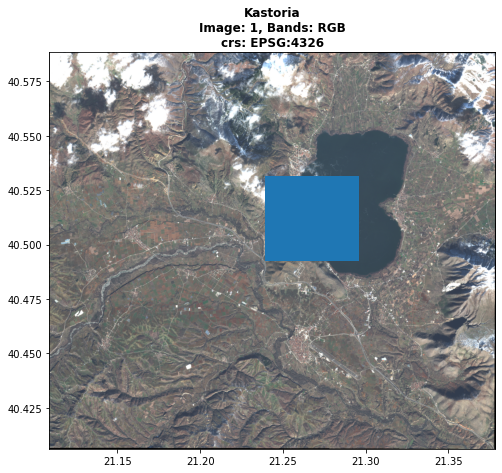

In [41]:
with rasterio.open(fp=full_kastoria_new_crs_tiff_path, mode='r') as kastoria_tif: # open modified crs image dataset
    fig, ax = plt.subplots(figsize=(8,8))

    show(source=(kastoria_tif, (3,2,1)), ax=ax, title=f'Kastoria\nImage: 1, Bands: RGB\ncrs: {kastoria_tif.crs}', with_bounds=True)
    shape_file.plot(ax=ax)

We can see that the clipped area selected (ROI) is a rectangular that contains both water and land in order to spot the differences in different types of land usage in subsequent analysis.

Next, we plot the first image (first date) of the clipped dataset in RGB.

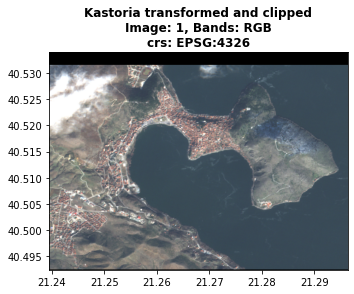

In [44]:
with rasterio.open(fp=full_kastoria_new_crs_clipped_tiff_path, mode='r') as kastoria_tif_transformed_clipped: # open modified crs and clipped image dataset
    show(source=(kastoria_tif_transformed_clipped, (3,2,1)), title=f'Kastoria transformed and clipped\nImage: 1, Bands: RGB\ncrs: {kastoria_tif_transformed_clipped.crs}', with_bounds=True)

## Question 2.3
- For each available date, visualize NDVI band and calculate the mean NDVI value in the ROI (clipped image)

C:\Users\User\AppData\Local\Temp\ipykernel_6212\2688722270.py:5: RuntimeWarning: invalid value encountered in true_divide
  ndvi = np.divide(np.subtract(nir_band, red_band), np.add(nir_band, red_band))


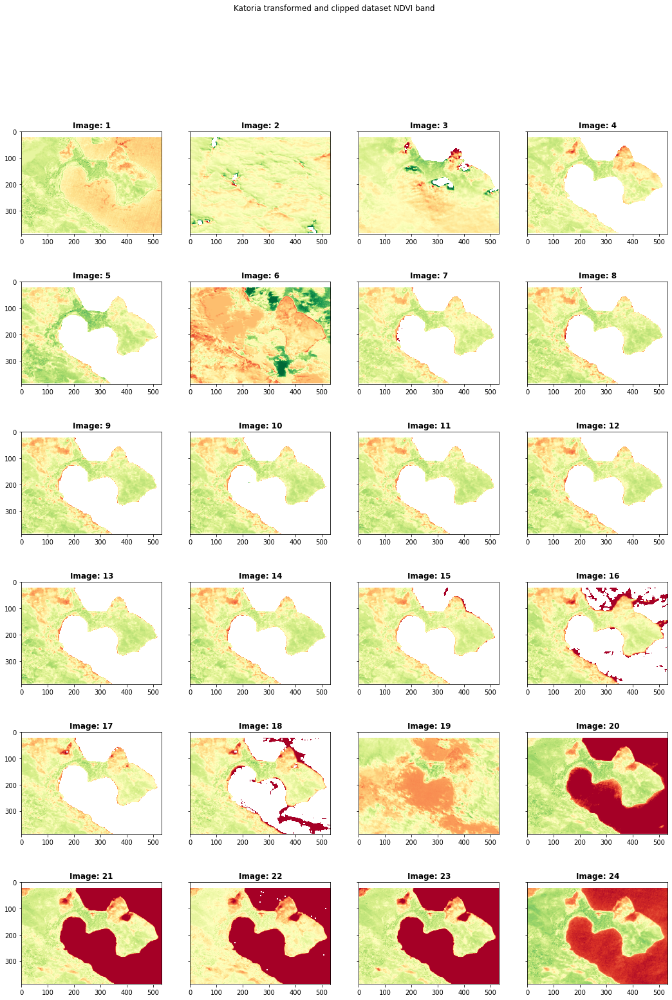

In [70]:
with rasterio.open(fp=full_kastoria_new_crs_clipped_tiff_path, mode='r') as kastoria_tif_transformed_clipped: # open modified crs and clipped image dataset
    fig, ax = plt.subplots(nrows=6, ncols=4, sharey=True, figsize = (18,25)) # prepare figure to plot 24 images for 24 distinct dates
    fig.suptitle('Katoria transformed and clipped dataset NDVI band')

    for i in range(1, kastoria_tif_transformed_clipped.count + 1, 10): #1 to 240 (included) with step 10 to get all the images's red and nir bands
        red_band_index, nir_band_index = i+3, i+4 #eg for first image the indexes are (3,4), for second image (13,14) etc.

        # calculate the ndvi band for each image of the transformed & clipped dataset
        red_band = kastoria_tif_transformed_clipped.read(red_band_index) # RED band
        nir_band = kastoria_tif_transformed_clipped.read(nir_band_index) # NIR band
        ndvi_band = calculate_ndvi_band(red_band=red_band, nir_band=nir_band) # NDVI band calculation

        # calculate image's count
        image_index = i // 10 + 1
        # plot figure grid for 6 rows and 4 columns starts from [0, 0] and goes all the way to [5, 3]
        plot_row_index = (image_index - 1) // 4
        plot_col_index = (image_index - 1) % 4

        # plot on the appropriate position of the figure's grid based on ax[] row and column indexes
        show(source=ndvi_band, ax=ax[plot_r6ow_index, plot_col_index], title=f'Image: {image_index}', cmap='RdYlGn', with_bounds=True)

    # add colorbar
    #fig.colorbar(image_hidden, ax=ax)

Next, we calculate the mean NDVI value of each pixel over the time series of the 24 dates (i.e. 24 ROI images) and plot it.

C:\Users\User\AppData\Local\Temp\ipykernel_6212\2688722270.py:5: RuntimeWarning: invalid value encountered in true_divide
  ndvi = np.divide(np.subtract(nir_band, red_band), np.add(nir_band, red_band))


Min NDVI value for the image with mean pixel ndvi values: -0.6353932023048401
Max NDVI value for the image with mean pixel ndvi values: 0.6414283514022827


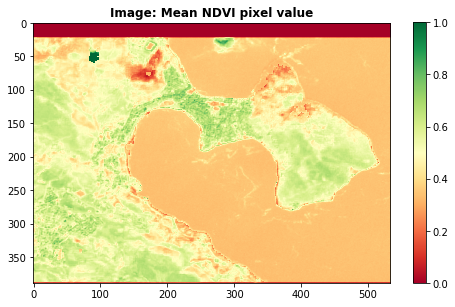

In [113]:
with rasterio.open(fp=full_kastoria_new_crs_clipped_tiff_path, mode="r") as clipped_dataset: # open the crs transfrmed and clipped dataset
    first_image_first_band = clipped_dataset.read(1) # select any band (here for simplicity the 1st) of the first image available in the dataset
    ndvi_sum_array = np.zeros_like(first_image_first_band) # array with zeros of proper size that will hold the sum of ndvi values over the 24 images (taking in 24 different dates)

with rasterio.open(fp=full_kastoria_new_crs_clipped_tiff_path, mode='r') as kastoria_tif_transformed_clipped: # open modified crs and clipped image dataset
    for i in range(1, kastoria_tif_transformed_clipped.count + 1, 10): #1 to 240 (included) with step 10 to get all the images's red and nir bands
        red_band_index, nir_band_index = i+3, i+4 #eg for first image the indexes are (3,4), for second image (13,14) etc.

        # calculate the ndvi band for each image of the transformed & clipped dataset
        red_band = kastoria_tif_transformed_clipped.read(red_band_index) # RED band
        nir_band = kastoria_tif_transformed_clipped.read(nir_band_index) # NIR band
        ndvi_band = calculate_ndvi_band(red_band=red_band, nir_band=nir_band) # NDVI band calculation

        # update nvdvi sum array by just adding element/pixel wise the values of each image one after another
        ndvi_sum_array = np.add(ndvi_sum_array, ndvi_band)

    # having added the ndvi values of each pixel for the 24 dates, we now have to divide with 24 to get the mean
    ndvi_mean_array = np.divide(ndvi_sum_array, 24)

    # display mean ndvi pixel value in a single image
    fig, ax = plt.subplots(figsize=(8, 8)) # figure with ndvi band and colormap on the side (vertical)
    # use imshow so that we have something to map the colorbar to
    image_hidden = ax.imshow(kastoria_tif_transformed_clipped.read(1), cmap='RdYlGn')
    # plot on the same axis with rio.plot.show
    show(source=ndvi_mean_array, ax=ax, title=f'Image: Mean NDVI pixel value', cmap='RdYlGn', with_bounds=True)
    # add colorbar using the now hidden image
    fig.colorbar(image_hidden, ax=ax, shrink=0.6)

print(f'Min NDVI value for the image with mean pixel ndvi values: {np.nanmin(ndvi_mean_array)}')
print(f'Max NDVI value for the image with mean pixel ndvi values: {np.nanmax(ndvi_mean_array)}')

## Question 2.4
- Present a graph with the progress of the NDVI index in time for the ROI
For this task we will calculate the mean value of all pixels of the NDVI band for each image/date and then plot the resulting time series.

In [126]:
mean_image_ndvi_series = []

with rasterio.open(fp=full_kastoria_new_crs_clipped_tiff_path, mode='r') as kastoria_tif_transformed_clipped: # open modified crs and clipped image dataset
    for i in range(1, kastoria_tif_transformed_clipped.count + 1, 10): #1 to 240 (included) with step 10 to get all the images's red and nir bands
        red_band_index, nir_band_index = i+3, i+4 #eg for first image the indexes are (3,4), for second image (13,14) etc.

        # calculate the ndvi band for each image of the transformed & clipped dataset
        red_band = kastoria_tif_transformed_clipped.read(red_band_index) # RED band
        nir_band = kastoria_tif_transformed_clipped.read(nir_band_index) # NIR band
        ndvi_band = calculate_ndvi_band(red_band=red_band, nir_band=nir_band) # NDVI band calculation

        # calculate mean ndvi image ignoring nans
        mean_image_ndvi = np.nanmean(ndvi_band)

        # append the list of mean ndvi image values
        mean_image_ndvi_series.append(mean_image_ndvi)

dates = ['2016-01-25', '2016-02-14', '2016-03-28', '2016-04-04', '2016-04-27', '2016-06-06', '2016-07-03', '2016-07-13', '2016-07-23', '2016-07-26', '2016-08-05','2016-08-12', '2016-08-15',
             '2016-08-22', '2016-09-04', '2016-09-14', '2016-10-01', '2016-10-14', '2016-11-13', '2016-12-03', '2016-12-10', '2016-12-20', '2016-12-23', '2016-12-30']
doy = [25, 45, 88, 95, 118, 158, 185, 195, 205, 208, 218, 225, 228, 235, 248, 258, 275,
       288, 318, 338, 345, 355, 358, 365]

C:\Users\User\AppData\Local\Temp\ipykernel_6212\2688722270.py:5: RuntimeWarning: invalid value encountered in true_divide
  ndvi = np.divide(np.subtract(nir_band, red_band), np.add(nir_band, red_band))


In [127]:
print('DOY, date pairs in dataset:')
for day_doy, date in zip(doy, dates):
    print(f'{day_doy, date}')

DOY, date pairs in dataset:
(25, '2016-01-25')
(45, '2016-02-14')
(88, '2016-03-28')
(95, '2016-04-04')
(118, '2016-04-27')
(158, '2016-06-06')
(185, '2016-07-03')
(195, '2016-07-13')
(205, '2016-07-23')
(208, '2016-07-26')
(218, '2016-08-05')
(225, '2016-08-12')
(228, '2016-08-15')
(235, '2016-08-22')
(248, '2016-09-04')
(258, '2016-09-14')
(275, '2016-10-01')
(288, '2016-10-14')
(318, '2016-11-13')
(338, '2016-12-03')
(345, '2016-12-10')
(355, '2016-12-20')
(358, '2016-12-23')
(365, '2016-12-30')


Text(0, 0.5, 'NDVI mean ROI')

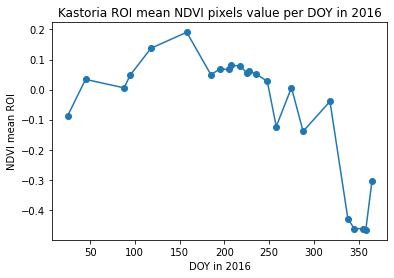

In [128]:
plt.plot(doy, mean_image_ndvi_series)
plt.scatter(doy, mean_image_ndvi_series)
plt.title('Kastoria ROI mean NDVI pixels value per DOY in 2016')
plt.xlabel('DOY in 2016')
plt.ylabel('NDVI mean ROI')

We observe that the highest mean NDVI pixels value is found on the 158th day of 2016 (2016-06-06), right in the summer which is somewhat expected. On the cotrary we observe lower values for winter months towards the end of year 2016 and at the beginning of it. Also, given that the ROI selected contains a large pater of water area, the NDVI mean values are fluctuating around 0, whereas if the area was mostly land, we might have expected higher mean ndvi values.

## Question 3
Υλοποιήστε και εξασκηθείτε με διάφορα χωρικά ερωτήματα και πράξεις με την βοήθεια της βιβλιοθήκης Geopandas στα vector δεδομένα σας. Δημιουργήστε στατικούς χάρτες με αυτά. Παρουσιάστε γραφήματα της χρονοσειράς δεδομένων.
[ενδεικτικές βιβλιοθήκες Python]: geopandas, pandas, matplotlib
[ενδεικτικά βήματα ερωτήματος]:
✓ Κατεβάστε vector δεδομένα από το https://geodata.gov.gr/, όπως διοικητικά όρια νομών, σιδηροδρομικό δίκτυο, τοποθεσίες νοσοκομείων κλπ.
✓ Χρησιμοποιήστε την βιβλιοθήκη geopandas για υλοποίηση χωρικών ερωτημάτων (όπως within, intersect, buffer, spatial join)
✓ Πραγματοποιήστε εξαγωγή από τη WFS υπηρεσία για το Corine Land Cover 2018 και τα δεδομένα που αφορούν την περιοχή μελέτης κλπ.
✓ Στατικοί χάρτες 1) Corine Land Cover στη περιοχή μελέτης, 2) του πολυγώνου της περιοχής μελέτης καθώς και 3) του σημείου των μετεωρολογικών δεδομένων κλπ.
✓ Γραφήματα με την εξέλιξη μετεωρολογικών μεταβλητών (πχ θερμοκρασία, υγρασία, κα) στον χρόνο.

## Question 3.1
- Download vector data from <a href="https://geodata.gov.gr/">https://geodata.gov.gr</a> such as municipalities' borderlines, railroads, hospitals locations etc.

Here, we download vector data from <a href="https://geodata.gov.gr/">https://geodata.gov.gr</a>. Goedata offers vector data about Greece on a range of topics.

In [3]:
geodata_gov_gr = 'http://geodata.gov.gr/geoserver/ows'
wfs_geodata_gov_gr = WebFeatureService(geodata_gov_gr)

In [4]:
def build_wfs_titles_dict(wfs: WebFeatureService) -> dict:
    """
    Read owslib.wfs.WebFeatureService item and restructure it to have as key its title (so it's identifiable)
    :param wfs: owslib.wfs.WebFeatureService() object
    :return: restructured dict with keys the wfs.contents.title attributes and values the keys of wfs.contents dict
    """
    wfs_contents_dict = wfs.contents
    restructured_dict = {}
    for key, value in wfs_contents_dict.items(): # for each item in the contents dict of the wfs
        title = value.title # extract the title of each content item of the wfs
        restructured_dict[title] = key # use the title as the key of a new dict

    return restructured_dict

In [5]:
wfs_contents_dict = build_wfs_titles_dict(wfs_geodata_gov_gr)
wfs_contents_dict.keys() # show the titles of the available wfs

dict_keys(['AERODROMIA', 'Arxaiologikos_xoros', 'FRAGMATA_ELLADAS', 'USA Population', 'aigialos_alexandroupolis', 'aigialos_deh_chaliwth', 'aigialos_fira', 'aigialos_fourkaria', 'aigialos_freatida', 'aigialos_karapolith', 'aigialos_karkani', 'aigialos_mandraki', 'aigialos_mikrolimano', 'aigialos_samothrakhs', 'aigialos_zastano', 'aisthitika_dash', 'aktogrammh', 'aktogrammi', 'arithmhsh_dromwn', 'at_da', 'brefonip_da', 'crete_iso_200', 'daktylios_da', 'dasarxeia', 'delta_falhrou', 'dhmosia_kthria', 'dhmosia_wifi', 'dianomh_fyllwn_xartoy_OKXE_1_pros_5000_EGSA87', 'diethneis_synthikes', 'dimotika_at', 'ektrofeia_thiramatwn', 'elegxomenes_kynhgetikes_perioxes', 'elegxomenes_kynigetikes_perioxes', 'enories_athinwn', 'ethikoi_drymoi', 'ethnika_parka', 'ethniko_parko_sxinia', 'ethnikos_drymos_oitis', 'fysiko_aerio_kommothnh_alexandroupolh', 'galazies_shmaies_2008', 'galazies_shmaies_2009', 'galazies_shmaies_2010', 'iso_50_hrakleio', 'istoriko_kentro_da_line', 'istoriko_kentro_da_poly', 'kalog

In [37]:
def get_wfs_data_layer(url: str, layer_name: str) -> gpd.geodataframe.GeoDataFrame:
    """
    :param url: server url to request for WFS data, eg 'http://geodata.gov.gr/geoserver/ows'
    :param wfs_content:
    :return:
    """
    params = {'service' : 'WFS' , 'request' : 'GetFeature',
             'typeName' : layer_name , 'outputFormat' : 'json'}
    _request = Request(method='GET', url=url, params=params).prepare().url
    geopandas_file = gpd.read_file(_request) # read file with geopandas in a dataframe
    return geopandas_file # geodataframe returned

In [47]:
aerodromia = get_wfs_data_layer(geodata_gov_gr, wfs_contents_dict['AERODROMIA'])

In [9]:
aerodromia

,id,onoma,geometry
0,1,"Δασκαλογιάννης CHQ Χανιά, Σούδα",POINT (512886.533 3932001.696)
1,2,Μάλεμε,POINT (484540.131 3931694.148)
2,3,Τυμπάκι LG54\n,POINT (568297.267 3880601.588)
3,4,Νίκος Καζαντζάκης LGIR HER Ηράκλειο,POINT (607090.104 3911052.691)
4,5,Καστέλι LGTL\n,POINT (620681.353 3894883.025)
...,...,...,...
69,70,Μήλου LGML MLO,POINT (542178.120 4061029.554)
70,71,Πάρος LGPA PAS,POINT (600203.447 4096454.090)
71,72,Νάξου LGNX JNK,POINT (621458.775 4104866.922)
72,73,Μύκονος LGMK JMK,POINT (619008.074 4143753.749)


Above, we were able to see in a table what a WFS layer includes, eg for the airports of Greece.
In order to place markers on a map of Greece, we need to first find a raster RGB image of the country. Towards this purpose we can use a Web Map Service (WMS) to download a raster RGB image and then select a bounding box for Greece. Wwe selected the following <a href="https://www.geoseer.net/rl.php?ql=78ea2e14b2fdd525&p=1&q=landsat%20150%20Europe#">WMS service</a>

In [9]:
wms_service = 'https://www.datagrandest.fr/geoserver/ows?SERVICE=WMS&'
wms_instance = WebMapService(wms_service)
wms_contents_dict = build_wfs_titles_dict(wms_instance)
wms_contents_dict.keys() # show the titles of the available wms

C:\Users\User\Downloads\DSML MsC\2nd semester\Γεωχωρικα\Geospatial_Lab Exercises\virtualenv\lib\site-packages\owslib\map\wms111.py:121: UserWarning: Content metadata for layer "ems:EMS_SERTIT_OCS_2017" already exists. Using child layer
  warnings.warn('Content metadata for layer "%s" already exists. Using child layer' % cm.id)


dict_keys(["Base de Données des Emprises d'Activités - 2019", "Base de Données des Emprises d'Activités Enrichie- 2019", 'CIGAL BDOCS V2 2000', 'CIGAL BDOCS V2 2008', 'CIGAL BDOCS V2 2011-2012', 'CIGAL BDZDH 2008', 'EMS SERTIT occupation du sol et végétation grande échelle 2017', 'EMS filaire schématique de voirie', "EMS denomination cours d' eau", 'EMS SERTIT schématique de voirie avec largeurs', 'EMS SERTIT bâtiments 2017', 'EMS SERTIT surfaces en eau 2017', 'EMS Plan cadastral', 'Orthoimages Infrarouge couleurs les plus récentes Grand Est', 'Orthoimage RVB Grand Est PVA 2018-2019', 'Orthoimages les plus récentes Grand Est', 'Assemblage ortho RVB CA 2016', 'ORTHO_2007_2010_GRAND_EST', 'Assemblage des ortho 2014 à 2016 du Grand Est', 'Assemblage ortho RVB 2016 CA', 'couche agrégée du PCI', 'Assemblage des couches du PCI vecteur 2017', 'Occupation du sol dans le Grand Est - 2010', 'Occupation du sol dans le Grand Est - 2019', 'ocs_evolutions_2010_2019', 'AD68 - Carte du 20/03/1916 de C

In [10]:
# select the proper layer
european_layer = wms_instance[wms_contents_dict['CRA Image satellite 150m Landsat 7 et 8']]

In [11]:
# define two functions to print useful information about the wms service and a layer on the returned map
def print_wms_service_info(wms_service, wms_instance):
    print(f'WMS service:\t{wms_service}\t\tversion:{wms_instance.version}\n'
          f'Title:\t\t\t{wms_instance.identification.title}\n'
          f'Provider:\t\t{wms_instance.provider.name}, {wms_instance.provider.url}\n')

def print_wms_layer_info(layer):
    print(f'WMS map layer\n'
          f'Title:\t\t\t{layer.title}\n'
          f'Bounding Box:\t{layer.boundingBox[0:4]}\n'
          f'CRS:\t\t\t{layer.boundingBox[4]}\n'
          f'CRS options:\t{layer.crsOptions}\n')

In [12]:
print_wms_service_info(wms_service, wms_instance)
print('----------------------------------------')
print_wms_layer_info(european_layer)

WMS service:	https://www.datagrandest.fr/geoserver/ows?SERVICE=WMS&		version:1.1.1
Title:			GeoGrandEst WMS Service
Provider:		Région Grand Est / GéoGrandEst, http://geoserver.org

----------------------------------------
WMS map layer
Title:			CRA Image satellite 150m Landsat 7 et 8
Bounding Box:	(-26.0, 27.999999999999964, 62.00000000000007, 74.0)
CRS:			EPSG:4326
CRS options:	['EPSG:3949', 'EPSG:3944', 'EPSG:3948', 'EPSG:27564', 'EPSG:3947', 'EPSG:27563', 'EPSG:27571', 'EPSG:27562', 'EPSG:23030', 'EPSG:900913', 'EPSG:3943', 'EPSG:27572', 'EPSG:3946', 'EPSG:23032', 'EPSG:32630', 'EPSG:4326', 'EPSG:4171', 'EPSG:23031', 'EPSG:4258', 'EPSG:32632', 'EPSG:27574', 'EPSG:3942', 'EPSG:2154', 'EPSG:3857', 'EPSG:32631', 'EPSG:27573', 'EPSG:3945', 'EPSG:27561', 'EPSG:3950']



In [126]:
# from the layer select Greece bounding box
img_greece = wms_instance.getmap(
    layers = [wms_contents_dict['CRA Image satellite 150m Landsat 7 et 8']],
    srs=european_layer.boundingBox[4], # EPSG:4326
    bbox=(20.1500159034, 34.9199876979, 26.6041955909, 41.8269046087), # bounding box for greece, as described in https://gist.github.com/graydon/11198540
    size=(1920, 1080), # size in pixels (width, height)
    format='image/geotiff')

In [10]:
greece_raster_RGB_path = os.getcwd() + '/Greece RGB raster/greece_raster_rgb.geotiff2'

In [127]:
# save the raster RGB image of Greece in a tiff file
with open(file=greece_raster_RGB_path, mode='wb') as tiff_output: # save the tiff image
    tiff_output.write(img.read())

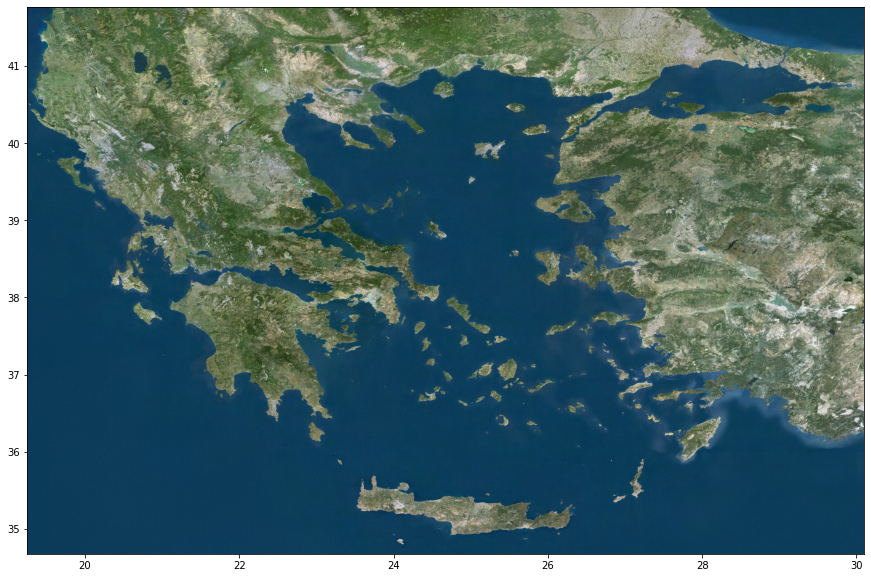

In [11]:
# open Greece RGB raster tiff image and show the map of Greece using rasterio
with rasterio.open(fp=greece_raster_RGB_path, mode='r') as tiff_img:
    fig, ax = plt.subplots(figsize = (15,15))
    show(tiff_img, ax=ax)

Moving forward, we can now add features on top of the raster map of Greece.

First, we plot the airports in Greece with black markers.

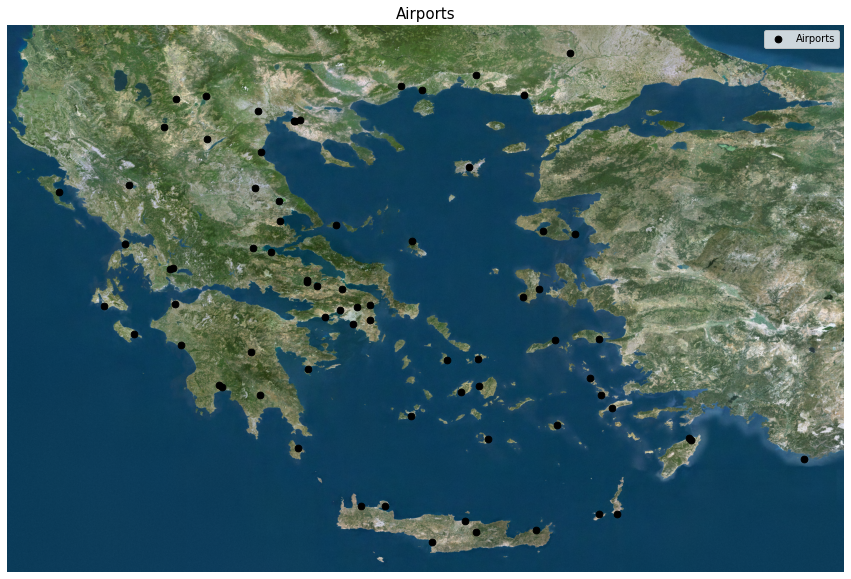

In [148]:
crs = european_layer.boundingBox[4] #EPSG:4326

fig, ax = plt.subplots(figsize=(15,15))
with rasterio.open(fp=greece_raster_RGB_path, mode='r') as tiff_img:
    aerodromia.to_crs(crs=crs).plot(ax=ax, color='black', markersize=45, label='Airports') # transform airport geometries to appropriate crs and then plot to figure
    ax.set_title(label='Airports', fontsize=15) # title of figure
    show(source=tiff_img, ax=ax) # show the wms raster Greece map layer
ax.set_axis_off() # remove axis
plt.legend() # add legend
plt.show() # show

Then, we can add another layer, eg. the hydrographic network of the country.

In [13]:
def add_layers_and_display_plot(greece_raster_RGB_path, layers, colors, names, markersize=45, crs='EPSG:4326'):
    fig, ax = plt.subplots(figsize=(15,15))
    with rasterio.open(fp=greece_raster_RGB_path, mode='r') as tiff_img:
        show(source=tiff_img, ax=ax) # show the wms raster Greece map layer
    for layer, color, name in zip(layers, colors, names):
        layer.to_crs(crs=crs).plot(ax=ax, color=color, markersize=markersize, label=name) # transform geometries to appropriate crs and then plot to figure
    ax.set_title(label=", ".join(names), fontsize=15, color='black') # title of figure
    ax.set_axis_off() # remove axis
    plt.legend() # add legend
    plt.show() # show

In [61]:
hydrographic_network = get_wfs_data_layer(geodata_gov_gr, wfs_contents_dict['ydrografiko_diktyo'])

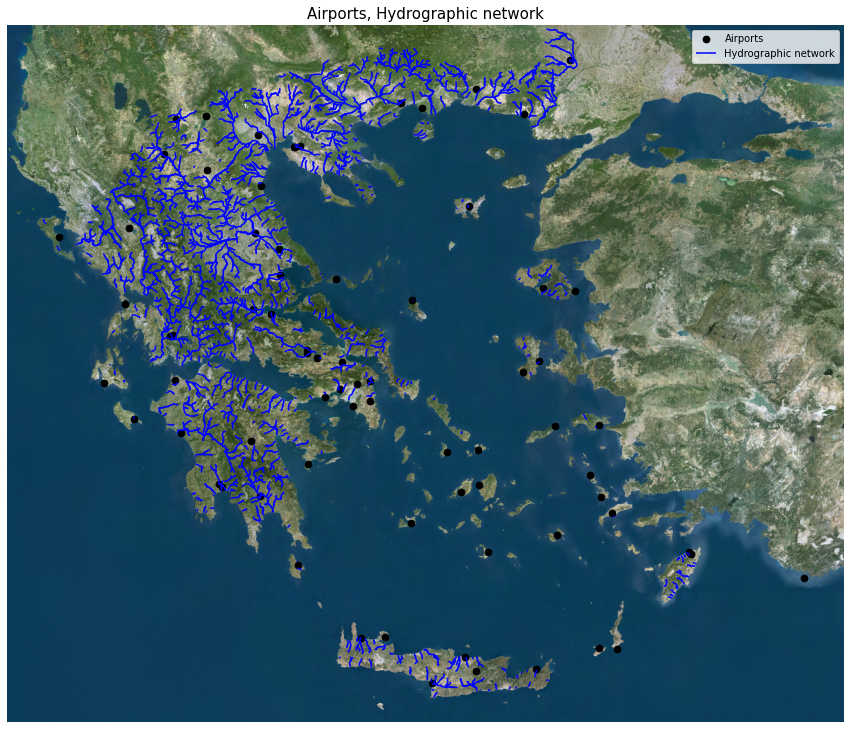

In [62]:
add_layers_and_display_plot(greece_raster_RGB_path=greece_raster_RGB_path,layers=[aerodromia, hydrographic_network], colors=['black', 'blue'], names=['Airports', 'Hydrographic network'])

Also we plot the counties of Greece below:

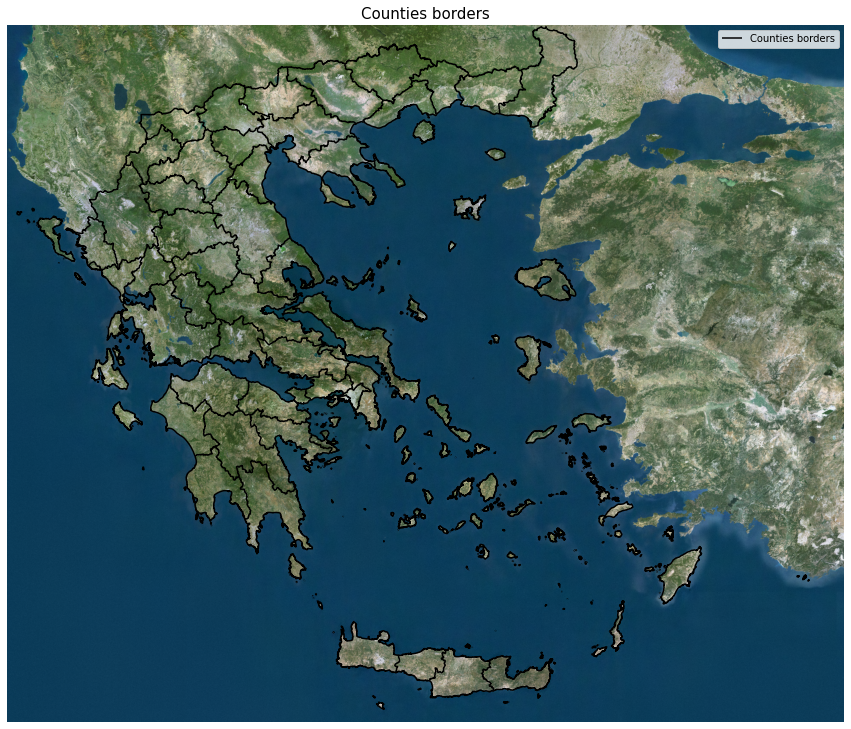

In [63]:
# display nomous / counties of Greece on the map
oria_nomwn = get_wfs_data_layer(geodata_gov_gr, wfs_contents_dict['oria_nomwn'])
add_layers_and_display_plot(greece_raster_RGB_path,
                            layers=[oria_nomwn],
                            colors=['black'],
                            names=['Counties borders'])

## Question 3.2
- Use the geopandas library to implement spatial queries such as within, intersect, buffer and spatial join

### Query 1
Find the top 10 regions in Greece with the highest demand levels for energy with regards to household heating (data: 2015, <a href="https://geodata.gov.gr/en/dataset/zetese-energeias-gia-thermanse-apo-noikokuria/resource/b53ed012-b842-47e7-9eee-851624b1a014">source</a>).

In [9]:
# display available features in wfs service
import pprint
pprint.pprint(wfs_contents_dict.keys())

dict_keys(['AERODROMIA', 'Arxaiologikos_xoros', 'FRAGMATA_ELLADAS', 'USA Population', 'aigialos_alexandroupolis', 'aigialos_deh_chaliwth', 'aigialos_fira', 'aigialos_fourkaria', 'aigialos_freatida', 'aigialos_karapolith', 'aigialos_karkani', 'aigialos_mandraki', 'aigialos_mikrolimano', 'aigialos_samothrakhs', 'aigialos_zastano', 'aisthitika_dash', 'aktogrammh', 'aktogrammi', 'arithmhsh_dromwn', 'at_da', 'brefonip_da', 'crete_iso_200', 'daktylios_da', 'dasarxeia', 'delta_falhrou', 'dhmosia_kthria', 'dhmosia_wifi', 'dianomh_fyllwn_xartoy_OKXE_1_pros_5000_EGSA87', 'diethneis_synthikes', 'dimotika_at', 'ektrofeia_thiramatwn', 'elegxomenes_kynhgetikes_perioxes', 'elegxomenes_kynigetikes_perioxes', 'enories_athinwn', 'ethikoi_drymoi', 'ethnika_parka', 'ethniko_parko_sxinia', 'ethnikos_drymos_oitis', 'fysiko_aerio_kommothnh_alexandroupolh', 'galazies_shmaies_2008', 'galazies_shmaies_2009', 'galazies_shmaies_2010', 'iso_50_hrakleio', 'istoriko_kentro_da_line', 'istoriko_kentro_da_poly', 'kalog

In [23]:
zhthsh_energeias_noikokyriwn = get_wfs_data_layer(geodata_gov_gr, wfs_contents_dict['zhthsh_energeias_noikokyriwn'])

In [24]:
zhthsh_energeias_noikokyriwn

,id,COD_91,U_E_OTA_91,U_E_OTA_PK,U_E_OTA_MK,U_L_OTA_91,U_L_OTA_PK,U_L_OTA_MK,h_noik,wr_noik,geometry
0,b53ed012-b842-47e7-9eee-851624b1a014.0,011001,Δ. ΑΜΦΙΛΟΧΙΑΣ,Δ. ΑΜΦΙΛΟΧΙΑΣ,Δ. ΑΜΦΙΛΟΧΙΑΣ,D. AMFILOXIAS,D. AMFILOXIAS,D. AMFILOXIAS,53073020.0,4928951.0,"MULTIPOLYGON (((253906.594 4314006.000, 253937..."
1,b53ed012-b842-47e7-9eee-851624b1a014.1,011101,Κ. ΑΓΡΙΔΙΟΥ,Κ. ΑΓΡΙΔΙΟΥ,Δ. ΙΝΑΧΟΥ,K. AGRIDIOY,K. AGRIDIOY,D. INAXOY,2611587.8,318989.0,"MULTIPOLYGON (((261871.547 4327475.000, 261980..."
2,b53ed012-b842-47e7-9eee-851624b1a014.2,011102,Κ. ΑΛΕΥΡΑΔΑΣ,Κ. ΑΛΕΥΡΑΔΑΣ,Δ. ΙΝΑΧΟΥ,K. ALEYRADAS,K. ALEYRADAS,D. INAXOY,1426274.6,159557.0,"MULTIPOLYGON (((277566.312 4315453.000, 277686..."
3,b53ed012-b842-47e7-9eee-851624b1a014.3,011103,Κ. ΑΜΟΡΓΙΑΝΩΝ,Κ. ΑΜΟΡΓΙΑΝΩΝ,Δ. ΙΝΑΧΟΥ,K. AMORGIANVN,K. AMORGIANVN,D. INAXOY,6205694.5,576173.0,"MULTIPOLYGON (((271574.906 4306995.000, 271755..."
4,b53ed012-b842-47e7-9eee-851624b1a014.137,014127,Κ. ΚΑΣΤΑΝΕΑΣ,Κ. ΚΑΣΤΑΝΕΑΣ,Δ. ΠΛΑΤΑΝΟΥ,K. KASTANEAS,K. KASTANEAS,D. PLATANOY,308690.2,73423.0,"MULTIPOLYGON (((309907.188 4281328.000, 309898..."
...,...,...,...,...,...,...,...,...,...,...,...
5917,b53ed012-b842-47e7-9eee-851624b1a014.5917,A46106,Κ. ΚΥΨΕΛΗΣ ΜΕΘΑΝΩΝ,Κ. ΚΥΨΕΛΗΣ ΜΕΘΑΝΩΝ,Δ. ΜΕΘΑΝΩΝ,K. KYCELHS MEUANVN,K. KYCELHS MEUANVN,D. MEUANVN,2100839.0,181571.0,"MULTIPOLYGON (((447158.812 4165150.500, 447163..."
5918,b53ed012-b842-47e7-9eee-851624b1a014.5918,A46107,Κ. ΜΕΓΑΛΟΧΩΡΙΟΥ,Κ. ΜΕΓΑΛΟΧΩΡΙΟΥ,Δ. ΜΕΘΑΝΩΝ,K. MEGALOXVRIOY,K. MEGALOXVRIOY,D. MEUANVN,4868974.5,445975.0,"MULTIPOLYGON (((440271.656 4164888.500, 440275..."
5919,b53ed012-b842-47e7-9eee-851624b1a014.5919,A46108,Κ. ΤΑΚΤΙΚΟΥΠΟΛΕΩΣ,Κ. ΤΑΚΤΙΚΟΥΠΟΛΕΩΣ,Δ. ΤΡΟΙΖΗΝΟΣ,K. TAKTIKOYPOLEVS,K. TAKTIKOYPOLEVS,D. TROIZHNOS,8131791.5,783727.0,"MULTIPOLYGON (((444412.594 4156008.000, 444419..."
5920,b53ed012-b842-47e7-9eee-851624b1a014.5920,A46109,Κ. ΤΡΟΙΖΗΝΟΣ,Κ. ΤΡΟΙΖΗΝΟΣ,Δ. ΤΡΟΙΖΗΝΟΣ,K. TROIZHNOS,K. TROIZHNOS,D. TROIZHNOS,10887469.0,1004789.0,"MULTIPOLYGON (((440267.094 4152669.000, 440353..."


In [34]:
print('Household energy demand for heating, 2015, top 10 regions in Greece:\n')
top_10_energy_demand = zhthsh_energeias_noikokyriwn.sort_values(by='wr_noik', ascending=False)['U_E_OTA_91'].head(10).values.tolist()
for region in top_10_energy_demand:
    print(region)

Household energy demand for heating, 2015, top 10 regions in Greece:

Δ. ΑΘΗΝΑΙΩΝ
Δ. ΘΕΣΣΑΛΟΝΙΚΗΣ
Δ. ΠΕΙΡΑΙΩΣ
Δ. ΠΑΤΡΕΩΝ
Δ. ΠΕΡΙΣΤΕΡΙΟΥ
Δ. ΗΡΑΚΛΕΙΟΥ
Δ. ΛΑΡΙΣΗΣ
Δ. ΚΑΛΛΙΘΕΑΣ
Δ. ΝΙΚΑΙΑΣ
Δ. ΚΑΛΑΜΑΡΙΑΣ


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


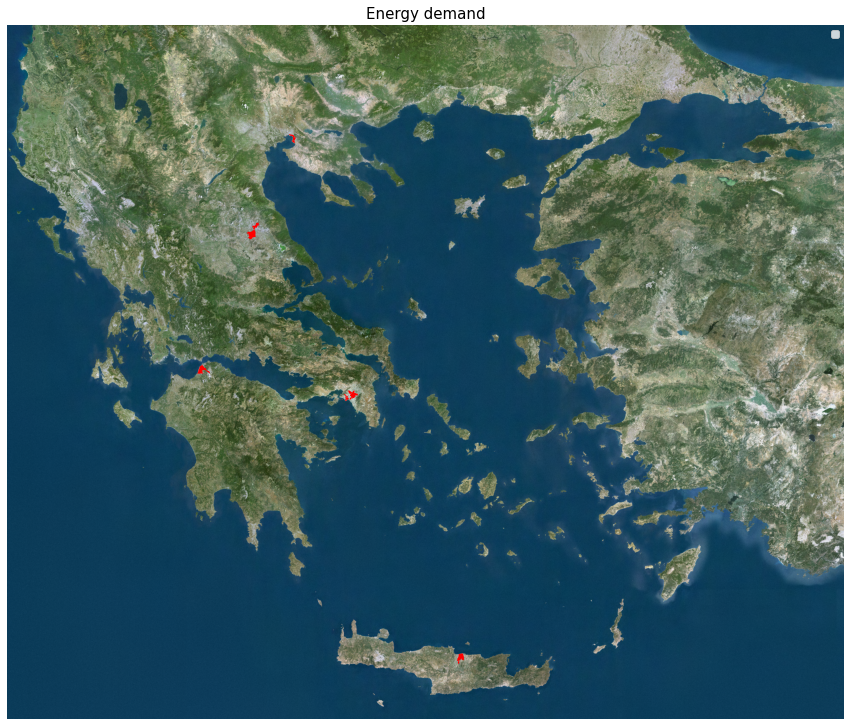

In [64]:
top_10_energy_demand_layer = zhthsh_energeias_noikokyriwn.sort_values(by='wr_noik', ascending=False).head(10)
add_layers_and_display_plot(greece_raster_RGB_path,
                            layers=[top_10_energy_demand_layer],
                            colors=['red'],
                            names=['Energy demand'])

### Query 2
Municipalities with the most airports

In [35]:
oria_dhmwn_kallikraths = get_wfs_data_layer(geodata_gov_gr, wfs_contents_dict['oria_dhmwn_kallikraths'])
oria_dhmwn_kallikraths

,id,NAME,KWD_YPES,geometry
0,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.0,Αμυνταίου,9070,"MULTIPOLYGON (((306603.594 4524540.000, 306778..."
1,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.1,Άθως,None,"MULTIPOLYGON (((521237.594 4461202.000, 521222..."
2,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.2,Άκτιου - Βόνιτσας,9124,"MULTIPOLYGON (((221292.406 4294039.000, 221292..."
3,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.3,Άνδρου,9268,"MULTIPOLYGON (((584417.125 4171609.000, 584399..."
4,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.4,Άργους - Μυκηνών,9233,"MULTIPOLYGON (((369695.313 4188647.000, 369719..."
...,...,...,...,...
321,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.318,Χαλκιδέων,9155,"MULTIPOLYGON (((456548.500 4260608.000, 456556..."
322,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.319,Χανίων,9325,"MULTIPOLYGON (((513757.000 3926876.000, 513737..."
323,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.320,Χερσονήσου,9309,"MULTIPOLYGON (((624971.625 3911239.000, 625026..."
324,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.321,Ψαρών,9267,"MULTIPOLYGON (((629706.812 4265487.000, 629682..."


In [41]:
aerodromia

,id,onoma,geometry
0,1,"Δασκαλογιάννης CHQ Χανιά, Σούδα",POINT (512886.533 3932001.696)
1,2,Μάλεμε,POINT (484540.131 3931694.148)
2,3,Τυμπάκι LG54\n,POINT (568297.267 3880601.588)
3,4,Νίκος Καζαντζάκης LGIR HER Ηράκλειο,POINT (607090.104 3911052.691)
4,5,Καστέλι LGTL\n,POINT (620681.353 3894883.025)
...,...,...,...
69,70,Μήλου LGML MLO,POINT (542178.120 4061029.554)
70,71,Πάρος LGPA PAS,POINT (600203.447 4096454.090)
71,72,Νάξου LGNX JNK,POINT (621458.775 4104866.922)
72,73,Μύκονος LGMK JMK,POINT (619008.074 4143753.749)


In [42]:
# keep geometry of airports that belong to municipalities
municipalities_airports = gpd.sjoin(aerodromia, oria_dhmwn_kallikraths)
municipalities_airports

,id_left,onoma,geometry,index_right,id_right,NAME,KWD_YPES
0,1,"Δασκαλογιάννης CHQ Χανιά, Σούδα",POINT (512886.533 3932001.696),322,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.319,Χανίων,9325
1,2,Μάλεμε,POINT (484540.131 3931694.148),248,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.251,Πλατανιά,9323
2,3,Τυμπάκι LG54\n,POINT (568297.267 3880601.588),276,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.303,Φαιστού,9308
3,4,Νίκος Καζαντζάκης LGIR HER Ηράκλειο,POINT (607090.104 3911052.691),132,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.111,Ηρακλείου,9305
4,5,Καστέλι LGTL\n,POINT (620681.353 3894883.025),201,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.183,Μινώα Πεδιάδας,9307
...,...,...,...,...,...,...,...
69,70,Μήλου LGML MLO,POINT (542178.120 4061029.554),179,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.182,Μήλου,9287
70,71,Πάρος LGPA PAS,POINT (600203.447 4096454.090),218,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.231,Πάρου,9294
71,72,Νάξου LGNX JNK,POINT (621458.775 4104866.922),48,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.204,Νάξου & Μικρών Κυκλάδων,9292
72,73,Μύκονος LGMK JMK,POINT (619008.074 4143753.749),44,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.200,Μυκόνου,9290


In [50]:
# display how many airports exist in municipalities in Greece
municipalities_airports.groupby(['NAME']).count().sort_values(by='onoma', ascending=False)['onoma']

NAME
Θέρμης        3
Αγρινίου      2
Χίου          2
Λέσβου        2
Ρόδου         2
             ..
Κεφαλονιάς    1
Κοζάνης       1
Κομοτηνής     1
Κυθήρων       1
Χανίων        1
Name: onoma, Length: 68, dtype: int64

In [71]:
# keep geometries of municipalities that have airports
municipalities_that_have_airports = gpd.sjoin(aerodromia, oria_dhmwn_kallikraths, how='right').dropna()
municipalities_that_have_airports

,index_left,id_left,onoma,id_right,NAME,KWD_YPES,geometry
2,23.0,24.0,Πρέβεζας LGPZ PVK Άκτιου,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.2,Άκτιου - Βόνιτσας,9124,"MULTIPOLYGON (((221292.406 4294039.000, 221292..."
5,28.0,29.0,Έδεσσας LGED,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.5,Έδεσσας,9043,"MULTIPOLYGON (((331004.812 4529726.000, 331026..."
22,21.0,22.0,Αιτωλοακαρνανίας-Αγρίνιο-ΚΑΑΓ LGAG/AGQ-Υπο Ανα...,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.22,Αγρινίου,9123,"MULTIPOLYGON (((287987.000 4307031.000, 288031..."
22,22.0,23.0,Αερολέσχη Αγρίνιο,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.22,Αγρινίου,9123,"MULTIPOLYGON (((287987.000 4307031.000, 288031..."
28,29.0,30.0,Γίδας LGAX AXY Αλεξάνδρεια,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.27,Αλεξάνδρειας,9023,"MULTIPOLYGON (((386514.406 4486527.000, 386510..."
...,...,...,...,...,...,...,...
307,53.0,54.0,Ελευθέριος Βενιζέλος LGAV ATH Διεθνή,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.288,Σπάτων - Αρτέμιδος,9226,"MULTIPOLYGON (((501069.094 4197844.000, 501080..."
309,27.0,28.0,Φλώρινα LGFL FLO,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.309,Φλώρινας,9072,"MULTIPOLYGON (((307035.688 4534459.000, 307045..."
314,60.0,61.0,Χίου LGHI JKH,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.314,Χίου,9266,"MULTIPOLYGON (((676438.625 4221482.000, 676443..."
314,61.0,62.0,Ολύμποι LG56,c7b5978b-aca9-4d74-b8a5-d3a48d02f6d0.314,Χίου,9266,"MULTIPOLYGON (((676438.625 4221482.000, 676443..."


Now we can plot on the map the municipalities (yellow color) and the airports within those municipalities (red dots/markers).

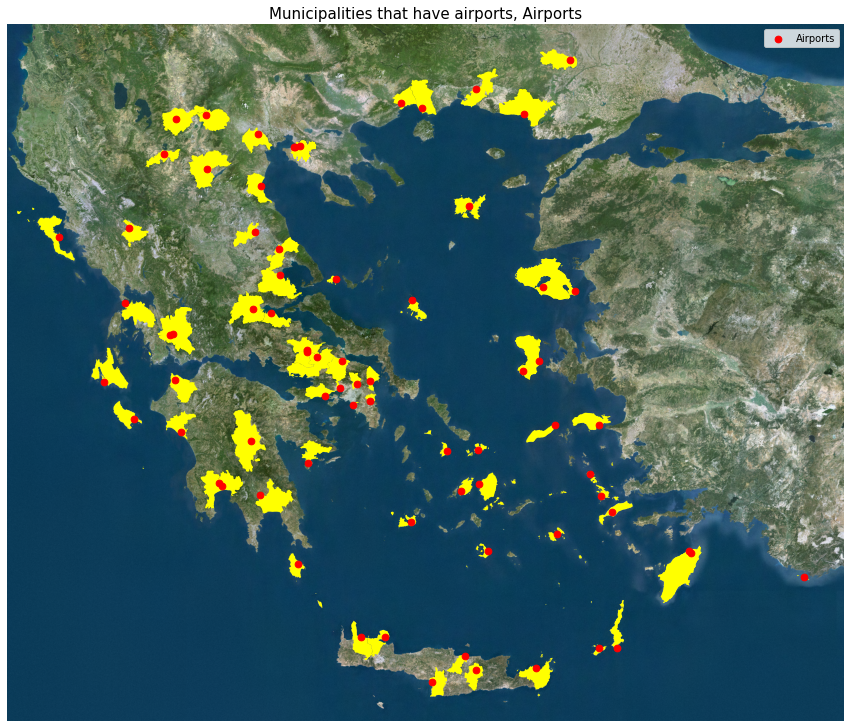

In [73]:
add_layers_and_display_plot(greece_raster_RGB_path,
                            layers=[municipalities_that_have_airports, municipalities_airports],
                            colors=['yellow', 'red'],
                            names=['Municipalities that have airports', 'Airports'])

### Query 3


Select Athens from the image returned by the WMS service.

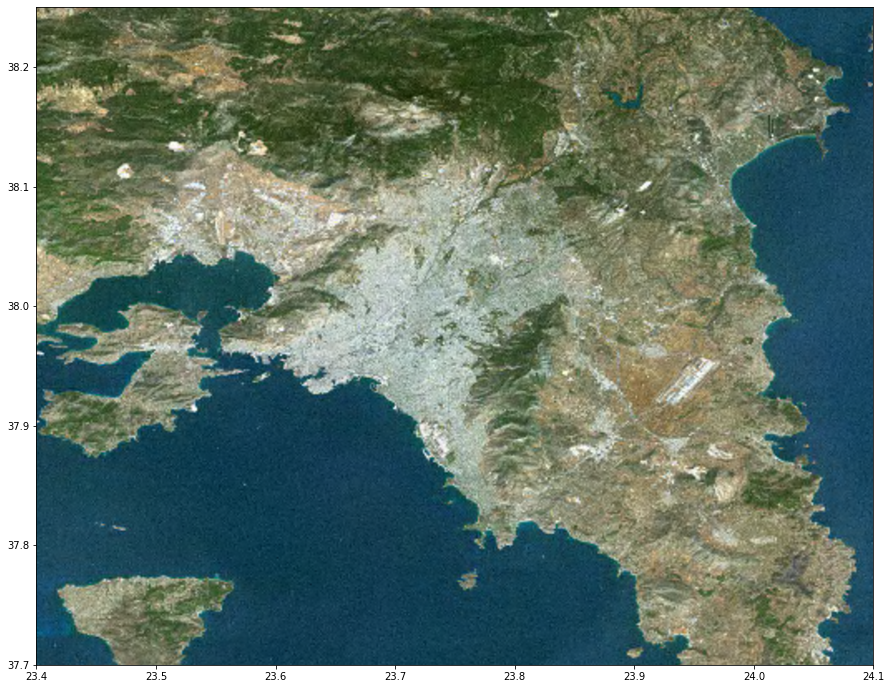

In [15]:
# from the layer select Athens bounding box
img_athens = wms_instance.getmap(
    layers = [wms_contents_dict['CRA Image satellite 150m Landsat 7 et 8']],
    srs='EPSG:4326', # EPSG:4326
    bbox=(23.4, 37.7, 24.1, 38.25), # bounding box for greece, as described in https://gist.github.com/graydon/11198540
    size=(1920, 1080), # size in pixels (width, height)
    format='image/geotiff')

athens_raster_RGB_path = os.getcwd() + '/Greece RGB raster/athens_raster_rgb.geotiff2'

# save the raster RGB image of Greece in a tiff file
with open(file=athens_raster_RGB_path, mode='wb') as tiff_output: # save the tiff image
    tiff_output.write(img_athens.read())

# open Athens RGB raster tiff image and show the map of Greece using rasterio
with rasterio.open(fp=athens_raster_RGB_path, mode='r') as tiff_img:
    fig, ax = plt.subplots(figsize = (15,15))
    show(tiff_img, ax=ax)

In [94]:
enories_athinwn = get_wfs_data_layer(geodata_gov_gr, wfs_contents_dict['enories_athinwn'])
enories_athinwn

,id,ONOMASIA,GEIT,geometry
0,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.0,ΧΡΙΣΤΟΥ ΣΩΤΗΡΟΣ (ΚΑΘΟΛΙΚΗ),ΙΟΥΛΙΑΝΟΥ-ΦΙΛΑΔΕΛΦΕΙΑΣ,POINT (475732.850 4204656.332)
1,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.1,ΑΓ. ΠΑΥΛΟΣ,ΑΓ.ΠΑΥΛΟΣ,POINT (475485.569 4204374.254)
2,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.2,ΑΓ. ΚΩΝΣΤΑΝΤΙΝΟΣ,ΠΛ.ΒΑΘΗΣ-ΑΓ.ΚΩΝ/ΝΟΣ,POINT (475714.747 4203826.747)
3,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.3,ΑΝΤΒΕΤΙΣΤΩΝ ΤΗΣ 7ΗΣ ΗΜΕΡΑΣ,ΠΛ.ΒΑΘΗΣ/ΑΓ.ΚΩΝ/ΝΟΣ,POINT (475448.105 4203736.945)
4,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.4,ΑΓ. ΑΝΑΡΓΥΡΟΙ,ΨΥΡΡΗ/ ΚΟΥΜΟΥΝΔΟΥΡΟΥ,POINT (475385.338 4203435.878)
...,...,...,...,...
160,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.160,ΕΛΛ. ΕΥΑΓ. ΕΚΚΛΗΣΙΑ,ΜΟΝΑΣΤΗΡΑΚΙ/ ΠΛΑΚΑ,POINT (476257.876 4202255.815)
161,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.161,ΓΕΝ. ΧΡΙΣΤΟΥ,ΨΥΡΡΗ/ ΚΟΥΜΟΥΝΔΟΥΡΟΥ,POINT (475601.939 4203082.834)
162,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.162,ΑΓ. ΠΑΡΑΣΚΕΥΗ,ΨΥΡΡΗ /ΚΟΥΜΟΥΝΔΟΥΡΟΥ,POINT (475540.787 4203192.763)
163,8ae90a8d-ab68-4c0a-8153-45cab12ee57a.163,ΑΓ. ΑΝΤΩΝΙΟΣ,ΑΓ.ΑΝΤΩΝΗΣ,POINT (477219.246 4208355.833)


In [28]:
stathmoi_k_staseis_oasa= get_wfs_data_layer(geodata_gov_gr, wfs_contents_dict['stathmoi_k_staseis_oasa'])
stathmoi_k_staseis_oasa

,scode,name,street,mode,id,geometry
0,020007,ΡΕΝΤΗΣ,ΕΝΤ.ΔΗΜΟΥ ΑΓ.ΙΩΑΝ.ΡΕΝΤΗ,ΠΡΟΑΣΤΙΑΚΟΣ,71,POINT (470642.000 4201433.000)
1,060612,ΑΘΗΝΑ,ΣΙΔΗΡΟΔΡΟΜΩΝ,ΠΡΟΑΣΤΙΑΚΟΣ,936,POINT (475251.000 4204729.000)
2,100010,ΣΤ.ΑΝΩ ΛΙΟΣΙΑ,ΚΟΜΒΟΣ ΑΤΤΙΚΗ ΟΔΟΣ-ΦΥΛΗΣ,ΠΡΟΑΣΤΙΑΚΟΣ,1776,POINT (474421.000 4213436.000)
3,120220,ΑΣΠΡΟΠΥΡΓΟΣ,ΝΟΤ.ΠΑΡ.ΟΔΟΥ.ΑΣΠΡΟΠΥΡΓΟΥ,ΠΡΟΑΣΤΙΑΚΟΣ,2153,POINT (465263.000 4214963.000)
4,130350,ΣΙΔΗΡ/ΚΟ ΚΕΝΤΡΟ ΑΧΑΡΝΩΝ,ΑΤΤΙΚΗ ΟΔΟΣ,ΠΡΟΑΣΤΙΑΚΟΣ,2536,POINT (476803.000 4212859.000)
...,...,...,...,...,...,...
7930,840021,ΓΑΛΑΖΙΑ ΑΚΤΗ,ΛΕΩΦ.ΑΘΗΝΩΝ-ΣΟΥΝΙΟΥ,ΛΕΩΦΟΡΕΙΟ/ΤΡΟΛΛΕΥ,7931,POINT (488360.000 4183531.000)
7931,840022,ΚΥΚΛΑΔΩΝ,ΛΕΩΦ.ΑΘΗΝΩΝ-ΣΟΥΝΙΟΥ,ΛΕΩΦΟΡΕΙΟ/ΤΡΟΛΛΕΥ,7932,POINT (488514.000 4183013.000)
7932,840023,ΚΕΡΚΥΡΑΣ,ΛΕΩΦ.ΣΑΡΩΝΙΔΟΣ,ΛΕΩΦΟΡΕΙΟ/ΤΡΟΛΛΕΥ,7933,POINT (491895.000 4177572.000)
7933,840024,ΚΥΚΛΑΔΩΝ,ΛΕΩΦ.ΑΘΗΝΩΝ-ΣΟΥΝΙΟΥ,ΛΕΩΦΟΡΕΙΟ/ΤΡΟΛΛΕΥ,7934,POINT (488549.000 4183053.000)


In [36]:
transportation_modes = stathmoi_k_staseis_oasa['mode'].unique()
print(transportation_modes)

['ΠΡΟΑΣΤΙΑΚΟΣ' 'ΜΕΤΡΟ (ΗΣΑΠ/ΑΜΕΛ)' 'ΛΕΩΦΟΡΕΙΟ/ΤΡΟΛΛΕΥ' 'ΜΕΤΡΟ/ΠΡΟΑΣΤΙΑΚΟΣ'
 'ΤΡΑΜ']


In [38]:
subuarban_railway = stathmoi_k_staseis_oasa[stathmoi_k_staseis_oasa['mode'] == transportation_modes[0]]
metro_isap = stathmoi_k_staseis_oasa[stathmoi_k_staseis_oasa['mode'] == transportation_modes[1]]
bus_trolley = stathmoi_k_staseis_oasa[stathmoi_k_staseis_oasa['mode'] == transportation_modes[2]]
metro_suburban_railway = stathmoi_k_staseis_oasa[stathmoi_k_staseis_oasa['mode'] == transportation_modes[3]]
tram = stathmoi_k_staseis_oasa[stathmoi_k_staseis_oasa['mode'] == transportation_modes[4]]

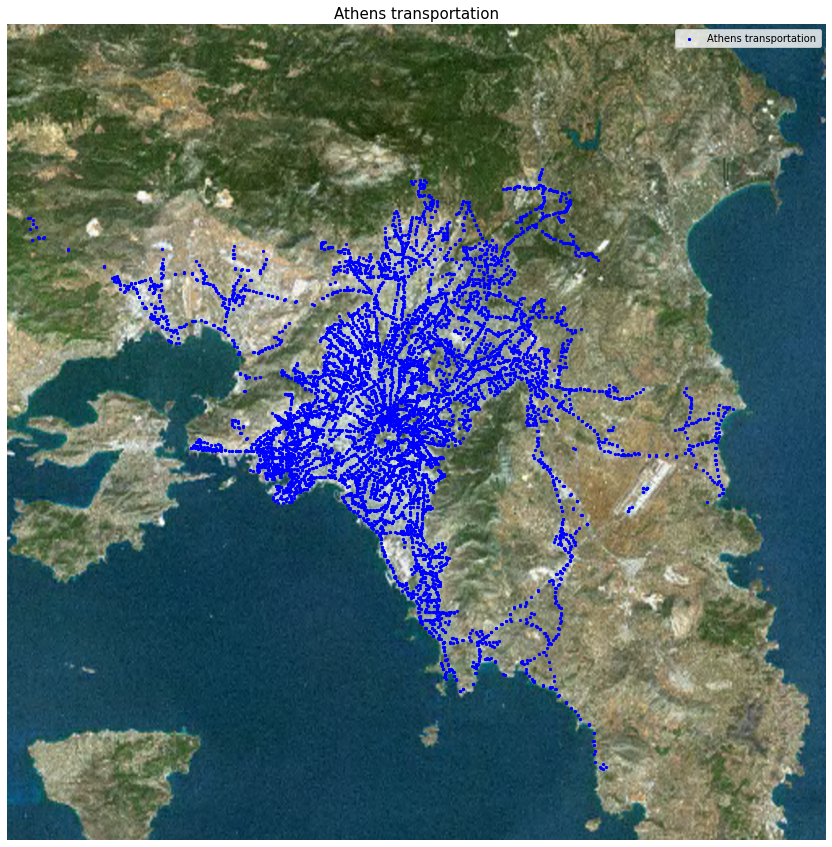

In [39]:
add_layers_and_display_plot(athens_raster_RGB_path,
                            layers=[stathmoi_k_staseis_oasa],
                            colors=['blue'],
                            names=['Athens transportation'],
                            markersize=5)

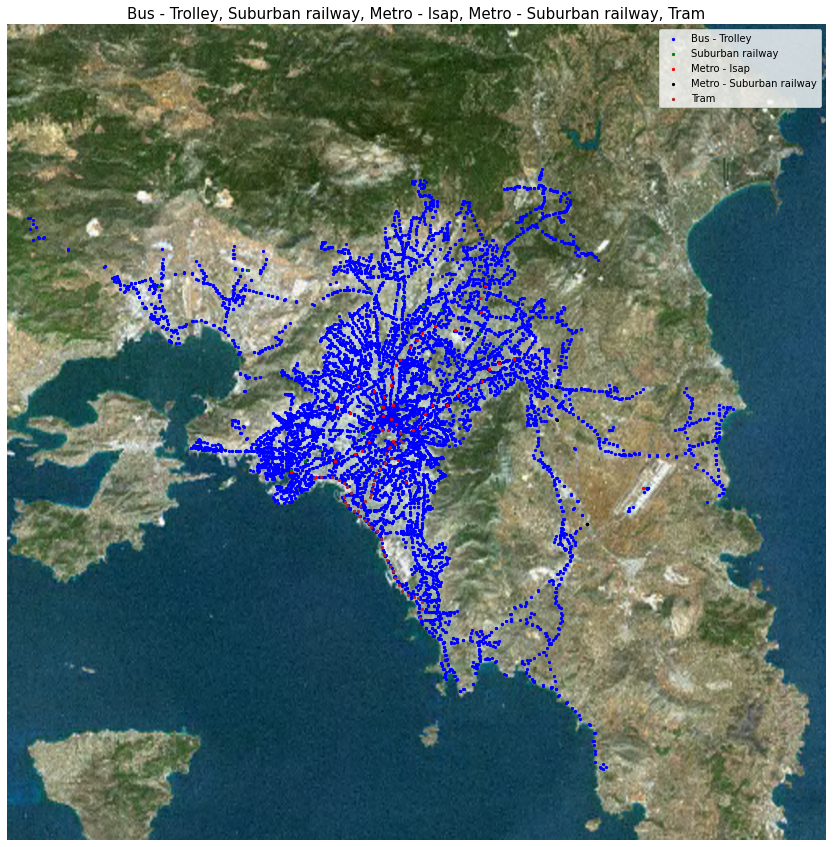

In [43]:
add_layers_and_display_plot(athens_raster_RGB_path,
                            layers=[bus_trolley, subuarban_railway, metro_isap, metro_suburban_railway, tram],
                            colors=['blue', 'green', 'red', 'black', 'brown'],
                            names=['Bus - Trolley', 'Suburban railway', 'Metro - Isap', 'Metro - Suburban railway', 'Tram'],
                            markersize=5)

## Question 3.3
Extract Corine Land Cover 2018 data for the ROI (region of interest) from the WFS service.
We select Gortinia, Dimitsana as the region of interest, a region south of Greece in Peloponnese.

In [11]:
# load wfs corine land cover for Belgium

belgium_wfs_service_url = 'https://wms.ngi.be/inspire23/landcover/wfs'
belgium_corine_land_cover_2018 = get_wfs_data_layer(url=belgium_wfs_service_url, layer_name='landcover:LandCoverUnit')
belgium_corine_land_cover_2018

,id,inspireid_identifier_namespace,lcclass,landcoverobservation_class_xlink_href,geometry
0,LandCoverUnit.be_14573,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((552900.134 665763.998, 552880.191 66..."
1,LandCoverUnit.be_14574,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((579856.709 665718.156, 579791.710 66..."
2,LandCoverUnit.be_14575,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((549844.060 666202.561, 549840.119 66..."
3,LandCoverUnit.be_14577,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((626341.453 666451.939, 626333.855 66..."
4,LandCoverUnit.be_14578,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((597183.993 665668.904, 597180.113 66..."
...,...,...,...,...,...
25103,LandCoverUnit.be_14595,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((579996.812 666358.496, 579916.815 66..."
25104,LandCoverUnit.be_14570,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((742405.683 661493.454, 742412.889 66..."
25105,LandCoverUnit.be_14571,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((576011.565 666178.504, 575966.565 66..."
25106,LandCoverUnit.be_14572,http://data.geo.be/id/lc.landcoverunit/975899e...,242,http://dd.eionet.europa.eu/vocabulary/landcove...,"POLYGON ((564720.903 666163.786, 564701.232 66..."


We can see that the land cover class is given by the column 'lcclass'. It's 44 3-digit integers for the corresponding 44 classes/usages of land as described <a href='https://collections.sentinel-hub.com/corine-land-cover/readme.html'>here</a>.

More info on the classes can be found on <a href='https://land.copernicus.eu/user-corner/technical-library/corine-land-cover-nomenclature-guidelines/html'>Copernicus website</a>.

In [14]:
# load wms for belgium

belgium_wms_service_url = 'https://wms.ngi.be/inspire23/landcover/ows?SERVICE=WMS&'
belgium_wms = WebMapService(belgium_wms_service_url)
belgium_wms_contents_dict = build_wfs_titles_dict(belgium_wms)

In [15]:
belgium_wms_contents_dict.keys()

dict_keys(['LandCoverUnit'])

In [16]:
belgium_land_cover_layer = belgium_wms[belgium_wms_contents_dict['LandCoverUnit']]

In [17]:
print_wms_service_info(wms_service=belgium_wms_service_url, wms_instance=belgium_wms)
print('----------------------------------------')
print_wms_layer_info(belgium_land_cover_layer)

WMS service:	https://wms.ngi.be/inspire23/landcover/ows?SERVICE=WMS&		version:1.1.1
Title:			INSPIRE View service - CORINE Land Cover-2018-Belgium
Provider:		National Geographic Institute, https://wms.ngi.be/inspire23/

----------------------------------------
WMS map layer
Title:			LandCoverUnit
Bounding Box:	(514655.59565632173, 520911.53092782426, 797149.1523945626, 746440.85331934)
CRS:			EPSG:3812
CRS options:	['EPSG:4258', 'EPSG:3812', 'EPSG:3035', 'EPSG:4326', 'EPSG:3857']



In [60]:
# Next we map the classes to RGB
# We donload the https://www.eea.europa.eu/data-and-maps/data/corine-land-cover-2000-clc2000-100-m-version-9-2007/corine-land-cover-2000-classes-and-rgb-color-codes/clc2000legend.xls and rename it

cls_classes_xls_path = './corine_land_cover_2000_mapping_of_classes.xls'
clc_dataframe = pd.read_excel(cls_classes_xls_path, header=0)
clc_dataframe.head(5)

,GRID_CODE,LEVEL1,LEVEL2,LEVEL3,CLC_CODE,LABEL1,LABEL2,LABEL3,RGB
0,1,1,1,1,111,Artificial surfaces,Urban fabric,Continuous urban fabric,230-000-077
1,2,1,1,2,112,Artificial surfaces,Urban fabric,Discontinuous urban fabric,255-000-000
2,3,1,2,1,121,Artificial surfaces,"Industrial, commercial and transport units",Industrial or commercial units,204-077-242
3,4,1,2,2,122,Artificial surfaces,"Industrial, commercial and transport units",Road and rail networks and associated land,204-000-000
4,5,1,2,3,123,Artificial surfaces,"Industrial, commercial and transport units",Port areas,230-204-204


In [61]:
# keep only the relevant columns
clc_dataframe.drop(axis=1, columns=['GRID_CODE', 'LEVEL1', 'LEVEL2', 'LEVEL3', 'LABEL1', 'LABEL2'], inplace=True)
clc_dataframe.head()

,CLC_CODE,LABEL3,RGB
0,111,Continuous urban fabric,230-000-077
1,112,Discontinuous urban fabric,255-000-000
2,121,Industrial or commercial units,204-077-242
3,122,Road and rail networks and associated land,204-000-000
4,123,Port areas,230-204-204


In [117]:
clc_dataframe['HEX'] = clc_dataframe['RGB']

In [118]:
colors = {}
classes = {}
for i in range(len(clc_dataframe)):
    rgb = clc_dataframe.loc[i, 'RGB']
    rgb_split = rgb.split("-")
    red, green, blue = int(rgb_split[0]), int(rgb_split[1]), int(rgb_split[2])
    hex = '#%02x%02x%02x' % (red, green, blue)
    clc_dataframe.loc[i, 'HEX'] = hex
    clc_code = clc_dataframe.loc[i, 'CLC_CODE']
    label = clc_dataframe.loc[i, 'LABEL3']
    colors[str(clc_code)] = hex
    classes[str(clc_code)] = label
clc_dataframe.head(5)

,CLC_CODE,LABEL3,RGB,HEX
0,111,Continuous urban fabric,230-000-077,#e6004d
1,112,Discontinuous urban fabric,255-000-000,#ff0000
2,121,Industrial or commercial units,204-077-242,#cc4df2
3,122,Road and rail networks and associated land,204-000-000,#cc0000
4,123,Port areas,230-204-204,#e6cccc


In [119]:
colors # display classes colors maping to RGB hex

{'111': '#e6004d',
 '112': '#ff0000',
 '121': '#cc4df2',
 '122': '#cc0000',
 '123': '#e6cccc',
 '124': '#e6cce6',
 '131': '#a600cc',
 '132': '#a64d00',
 '133': '#ff4dff',
 '141': '#ffa6ff',
 '142': '#ffe6ff',
 '211': '#ffffa8',
 '212': '#ffff00',
 '213': '#e6e600',
 '221': '#e68000',
 '222': '#f2a64d',
 '223': '#e6a600',
 '231': '#e6e64d',
 '241': '#ffe6a6',
 '242': '#ffe64d',
 '243': '#e6cc4d',
 '244': '#f2cca6',
 '311': '#80ff00',
 '312': '#00a600',
 '313': '#4dff00',
 '321': '#ccf24d',
 '322': '#a6ff80',
 '323': '#a6e64d',
 '324': '#a6f200',
 '331': '#e6e6e6',
 '332': '#cccccc',
 '333': '#ccffcc',
 '334': '#000000',
 '335': '#a6e6cc',
 '411': '#a6a6ff',
 '412': '#4d4dff',
 '421': '#ccccff',
 '422': '#e6e6ff',
 '423': '#a6a6e6',
 '511': '#00ccf2',
 '512': '#80f2e6',
 '521': '#00ffa6',
 '522': '#a6ffe6',
 '523': '#e6f2ff',
 '999': '#ffffff'}

In [120]:
# find the bounding box we need to cut
bounds = belgium_corine_land_cover_2018.to_crs('epsg:4326').dissolve().bounds

In [121]:
bounds

,minx,miny,maxx,maxy
0,2.18688,49.487988,6.421944,51.594544


In [49]:
# from the initial RGB WMS raster image of Europe, clip the Belgium part of it

img_belgium = wms_instance.getmap(layers = [wms_contents_dict['CRA Image satellite 150m Landsat 7 et 8']],
    srs='EPSG:4326',
    bbox=(bounds.loc[0, 'minx'], bounds.loc[0, 'miny'], bounds.loc[0, 'maxx'], bounds.loc[0, 'maxy']),
    size = (1920, 1080),
    format='image/geotiff')

In [50]:
# save the raster RGB image of Belgium in a tiff file
belgium_raster_RGB_path = os.getcwd() + '/Belgium RGB raster/belgium_raster_rgb.geotiff2'

with open(file=belgium_raster_RGB_path, mode='wb') as tiff_output: # save the tiff image
    tiff_output.write(img_belgium.read())

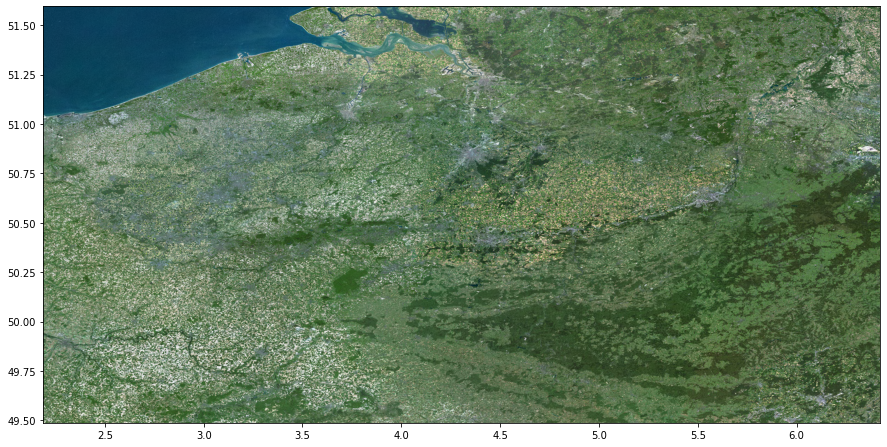

In [51]:
# open RGB raster tiff image and show the map of Belgium using rasterio
with rasterio.open(fp=belgium_raster_RGB_path, mode='r') as tiff_img:
    fig, ax = plt.subplots(figsize = (15,15))
    show(tiff_img, ax=ax)

Next, we will add on the wms raster image, the wfs corine land cover (clc) layer with the classified to categories land.

In [122]:
def add_clc_and_display_plot(raster_RGB_path, layer, colors, title, crs='EPSG:4326'):
    fig, ax = plt.subplots(figsize=(15,15))
    with rasterio.open(fp=raster_RGB_path, mode='r') as tiff_img:
        show(source=tiff_img, ax=ax) # show the wms raster map layer
        layer.to_crs(crs=crs).plot(ax=ax, color=colors) # transform geometries to appropriate crs and then plot to figure
    ax.set_title(label=title, fontsize=15, color='black') # title of figure
    ax.set_axis_off() # remove axis
    plt.show() # show

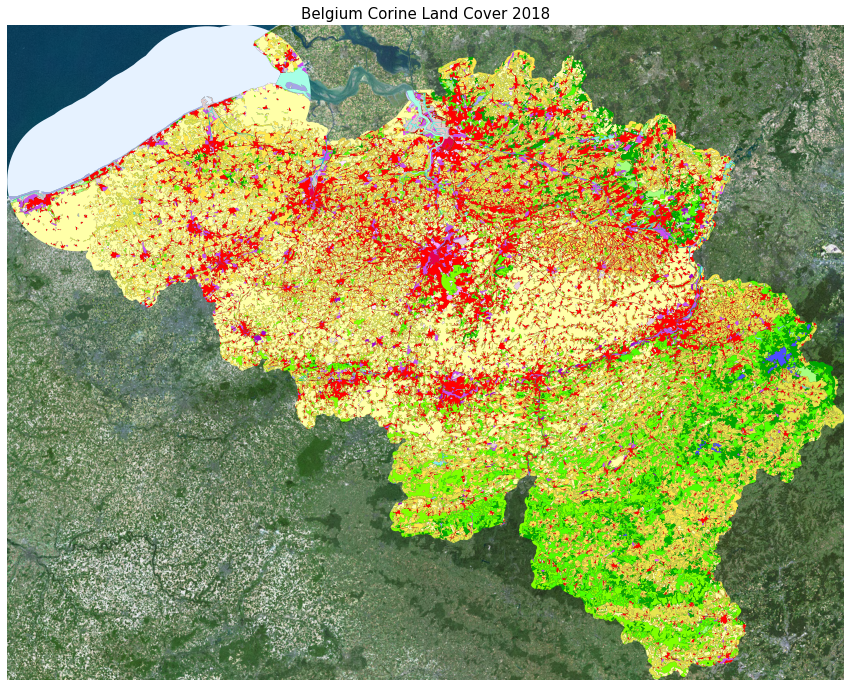

In [123]:
add_clc_and_display_plot(raster_RGB_path=belgium_raster_RGB_path,
    layer=belgium_corine_land_cover_2018,
    colors=belgium_corine_land_cover_2018['code'].map(colors),
    title='Belgium Corine Land Cover 2018')

## Question 3.4
Meteorological time series plotting for area of interest.

Next, we experiment with meterological data in the country. We select as a point of interest a point in the center of Ghent, a city of Belgium.
The point was selected in <a href="https://geojson.io/">geojson</a> and extracted as a shapefile.

<img src="Belgium RGB raster/Ghent_marker_ROI.jpg">

In [190]:
GHENT_POINT_SHAPEFILE = os.getcwd() + '/Shapefiles/Ghent ROI/POINT.shp' # path to Ghent point
ghent_shape_file = gpd.read_file(filename=GHENT_POINT_SHAPEFILE)
print('Shape file crs: ', ghent_shape_file.crs)

Shape file crs:  epsg:4326


In [191]:
ghent_shape_file

,geometry
0,POINT (3.72522 51.05607)


We downloaded metorological data from <a href="https://power.larc.nasa.gov/data-access-viewer/">NASA</a> for the ROI (point/marker in Ghent) and for the period between 01-01-2020 - 01-01-2022 and more specifically the following:
- Temperature at 2 Meters (C)
- Relative Humidity at 2 Meters (%)
- Precipitation (Corrected, mm/day)
- Wind Speed at 10 Meters (m/s)



In [17]:
ghent_meteorological_df = pd.read_csv('Ghent_ROI_meteorological_data_nasa_Point_Daily_20200101_20220101_051d0561N_003d7252E_LST.csv',header = 12)\
.rename(columns = {'T2M':'Temperature at 2 Meters',
                   'WS10M': 'Wind Speed at 10 Meters',
                   'RH2M': 'Relative Humidity at 2 Meters',
                   'PRECTOTCORR': 'Precipitation Corrected',
                   'MO': 'MONTH',
                   'DY': 'DAY'
                   })

ghent_meteorological_df['DATE'] = pd.to_datetime(ghent_meteorological_df[['YEAR', 'MONTH', 'DAY']])
ghent_meteorological_df.head(5)

,YEAR,MONTH,DAY,Temperature at 2 Meters,Wind Speed at 10 Meters,Precipitation Corrected,Relative Humidity at 2 Meters,DATE
0,2020,1,1,0.31,3.85,0.20,94.19,2020-01-01
1,2020,1,2,3.50,5.78,0.25,96.00,2020-01-02
2,2020,1,3,6.91,7.06,2.43,92.38,2020-01-03
3,2020,1,4,4.55,4.88,0.04,94.69,2020-01-04
4,2020,1,5,4.69,3.80,0.26,96.19,2020-01-05


Now we will plot!

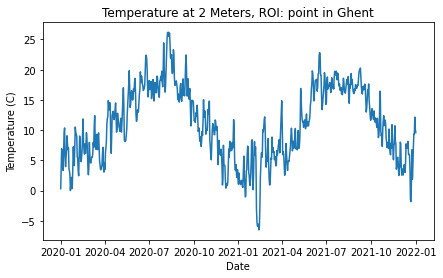

In [18]:
# Temperature at 2 Meters
fig, ax = plt.subplots(figsize = (7, 4))
ax.plot(ghent_meteorological_df['DATE'], ghent_meteorological_df['Temperature at 2 Meters'])
ax.set_title('Temperature at 2 Meters, ROI: point in Ghent')
ax.set_xlabel('Date')
ax.set_ylabel('Temperature (C)')
plt.show()

We can see there is periodicity on the temperature levels for the selected point, peaking during sumer months (July-August) as one would expect.

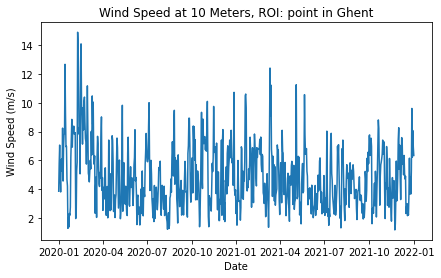

In [19]:
# Wind Speed at 10 Meters
fig, ax = plt.subplots(figsize = (7, 4))
ax.plot(ghent_meteorological_df['DATE'], ghent_meteorological_df['Wind Speed at 10 Meters'])
ax.set_title('Wind Speed at 10 Meters, ROI: point in Ghent')
ax.set_xlabel('Date')
ax.set_ylabel('Wind Speed (m/s)')
plt.show()

Windspeed, unlike temperature, exhibits very quick changes in its value within short time periods. However, no clear pattern can be detected apart from the observation that during some periods smaller peaks are detected.

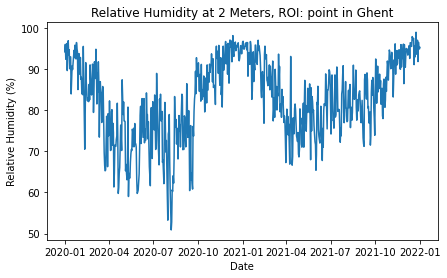

In [21]:
# Relative Humidity at 2 Meters
fig, ax = plt.subplots(figsize = (7, 4))
ax.plot(ghent_meteorological_df['DATE'], ghent_meteorological_df['Relative Humidity at 2 Meters'])
ax.set_title('Relative Humidity at 2 Meters, ROI: point in Ghent')
ax.set_xlabel('Date')
ax.set_ylabel('Relative Humidity (%)')
plt.show()

Again, we can see there is some periodicity on the humidity levels where the high peaks are observed during winter time and the low peaks in summer time.

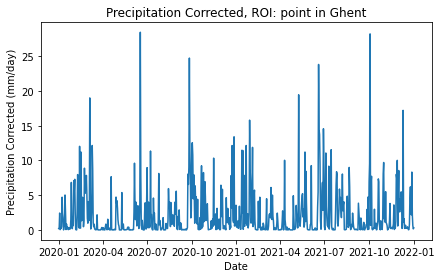

In [22]:
# Precipitation Corrected
fig, ax = plt.subplots(figsize = (7, 4))
ax.plot(ghent_meteorological_df['DATE'], ghent_meteorological_df['Precipitation Corrected'])
ax.set_title('Precipitation Corrected, ROI: point in Ghent')
ax.set_xlabel('Date')
ax.set_ylabel('Precipitation Corrected (mm/day)')
plt.show()

From the figure, we can see that there is a continuous of days with relatively high precipitation values during winter months, however this is not the case in spring/summer months.

## Question 4
Combine your raster and vector data and present interactive maps like web apps for visualization and processing of of geospatial data.

We present the results for this question in another notebook.